# 05 - Hitra Fourierova transformacija (FFT)
<p style="font-weight: 600; text-align: center;">
Matematično-fizikalni praktikum, november 2023 <br>
Luka Skeledžija, 28201079
</p>

<style>
.MJXc-display{
    display: inline-block !important;
    width: 100%;
}
@media print {
    .pagebreak { page-break-before: always; } /* page-break-after works, as well */
}

img{
    width: 100%;
    max-width: 600px !important;
    margin: auto !important;
}

body {
    overflow: hidden;
    max-width: 600px;
    margin: auto;
}

::-webkit-scrollbar {
  width: 0px;
}

table{
    width: 100%;
}

h1 {
    text-transform: uppercase;
    text-align: center;
    background: #222222;
    color: white;
    padding: 8px;
}

blockquote {
    margin-left: 0em!important;
    margin-right: 0em!important;

}

.jp-RenderedHTMLCommon pre, .jp-RenderedHTMLCommon code {

    background-color: var(--jp-layout-color2)!important;
}

.jp-RenderedHTMLCommon pre{
    margin: 0.5em 0em!important;
    padding: 0em 1.5em!important;
}

body {
    counter-reset: h2counter;
}
h1 {
    counter-reset: h2counter;
}
h2:before {
    content: counter(h2counter) ".\0000a0\0000a0";
    counter-increment: h2counter;
    counter-reset: h3counter;
}
h3:before {
    counter-increment: h3counter;
    content: counter(h2counter) "." counter(h3counter) ".\0000a0\0000a0";
  
}




</style>


---

## Uvod
Hitra Fourierova transformacija (FFT) je zelo uporabno orodje za analizo različnih vrst signalov. Njene prednosti vključujejo visoko hitrost in nizko porabo pomnilnika. Ti dve lastnosti nam omogočata analizo daljših signalov v primerjavi s standardno diskretno Fourierovo transformacijo (DFT). Z ustrezno implementacijo lahko zmanjšamo časovno zahtevnost iz $N^2$ na $N \log_2 N$, kar je za računalništvo bistvena pohitritev. Fourierove transformacije bomo uporabili za izračun (avto)korelacijskih funkcij, ki so definirane kot:

\begin{equation*}
  \phi_{gh}(\tau) = \frac{1}{T}\int\limits_0^{T} g(t+\tau)\,h(t)\,dt \>,  
\end{equation*}
ali za diskretne vrednosti
\begin{equation*}
  \phi_{gh}(n) = \frac{1}{N}\sum_{k=0}^{N-1} g_{k+n}\, h_k \>.
\end{equation*}

Z uporabo Fourierovih transformacij lahko konvolucijo prevedemo v množenje. Naj bosta $F = \mathcal{F}(f)$ in $G = \mathcal{F}(g)$, nato je korelacijska funkcija podana kot:
\begin{equation*}
  \phi_{gh}(n) = \frac{1}{N-n}\mathcal{F}^{-1} \left[ G \cdot (H)^\ast \right]
\end{equation*}
Za izračun avtokorelacijske funkcije uporabimo zgornjo enačbo, kjer je $g = h$. Avtokorelacijske funkcije nam bodo prišle prav pri analizi zašumljenih zvočnih signalov.


In [1]:
# Standardized imports for MFPR
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rc
import pandas as pd
import seaborn as sns
from IPython.display import HTML, display
import markdown
import datetime
import scipy.special as sp
import scipy.stats as stats
import scipy.optimize as opt
import scipy.interpolate as interp
from matplotlib import animation
import logging
import timeit
# Function and constants defitition for Juptyer notebook (rerun for hot reload of imports)

plt.rcParams['figure.dpi'] = 300
plt.rcParams['text.usetex'] = True
plt.rcParams["grid.linestyle"]="dashed"
# equivalent to rcParams['animation.html'] = 'html5'
rc('animation', html='html5')

def log_msg(msg, log_filename='my_log_file.log'):
    # Configure the logging module if not already configured
    if not logging.root.handlers:
        logging.basicConfig(
            filename=log_filename,
            level=logging.DEBUG,
            format='%(asctime)s - %(name)s - %(levelname)s - %(message)s'
        )

    # Create a logger for the function (you can replace 'my_function' with your desired logger name)
    logger = logging.getLogger('EIGENSTATES')

    # Log the provided message
    logger.info(msg)
def clear_log_file(log_filename='my_log_file.log'):
    with open(log_filename, 'w'):
        pass

def centerHTML(html, text=""):
    text = markdown.markdown(text)
    return '<div style="display: flex; align-items: center; flex-direction: column;">' + html + f'</div><div style="display: flex; align-items: center; flex-direction: column;padding-top: 15px;"><small style="max-width: 600px">{text}</small></div>'

def insertHTMLVideo(filename, text=""):
    return centerHTML(f'<video controls src="{filename}" style="max-width: 600px;width:100%"></video>', text)

def insertHTMLAudio(filename, text=""):
    return centerHTML(f'<audio controls src="{filename}" style="max-width: 600px;width:100%"></audio>', text)


clear_log_file()
log_msg('START logging...')


## Naloga

> Na spletni strani MF praktikuma najdeš posnetke
oglašanja velike uharice, naše največje sove.  Posneti sta
dve sovi z minimalnim ozadjem (${\tt bubomono}$ in ${\tt bubo2mono}$) in nekaj mešanih signalov, ki zakrivajo njuno oglašanje (${\tt mix}$, ${\tt mix1}$, ${\tt mix2}$ in ${\tt mix22}$).
V signalih ${\tt mix2}$ in ${\tt mix22}$ je oglašanje sove
komaj še zaznavno.  Izračunaj avtokorelacijsko funkcijo 
vseh signalov in poskusi ugotoviti, za katero sovo gre
pri teh najbolj zašumljenih signalih!

## Princip reševanja

1. Na podlagi posnetkov izrišemo spektrograme, da si vhodne podatke vizualiziramo.
2. Implementiramo autokorelacijsko funkcijo na različne načine in jih med sabo primerjamo.
3. Na podlagi zvočnih posnetkov izračunamo njihovo avtokorelacijsko funkcijo in skupaj z uporabo FFT poskusimo določiti sove v posnetkih.
4. Dodatek

In [2]:
from scipy.io import wavfile

p1, bubo = wavfile.read('./data/bubomono.wav')
p2, bubo2 = wavfile.read('./data/bubo2mono.wav')
p3, mix = wavfile.read('./data/mix.wav')
p4, mix1 = wavfile.read('./data/mix1.wav')
p5, mix2 = wavfile.read('./data/mix2.wav')
p6, mix22 = wavfile.read('./data/mix22.wav')

data = [bubo, bubo2, mix, mix1, mix2, mix22]
sampling = [p1, p2, p3, p4, p5, p6]
names = ['bubo', 'bubo2', 'mix', 'mix1', 'mix2', 'mix22']



## Vhodni podatki in vizualizacija

V Python uvozimo `.wav` datoteke in jih pretvorimo v `numpy` array. Določili bomo namreč katera sova nastopa v določenem posnetku.

In [3]:
datoteka = ['bubo', 'bubo2', 'mix', 'mix1', 'mix2', 'mix22']

tabela = [
    ['bubo.wav', 'Velika uharica Simon', '44800', 'Simon (bubo)'],
    ['bubo2.wav', 'Velika uharica Garfunkel', '44800', 'Garfunkel (bubo2)'],
    ['mix.wav', 'Neznana uharica + čricki', '44800', 'Simon (bubo)'],
    ['mix1.wav', 'Neznana uharica + čricki + potok', '44800', 'Simon (bubo)'],
    ['mix2.wav', 'Neznana uharica + čricki + deroča reka', '44800', 'Simon (bubo)'],
    ['mix22.wav', 'Neznana uharica + deroča reka', '44800', 'Garfunkel (bubo2)'],
]

tabela = np.array(tabela)
tabela[:, 3] = '?'
tabela[:, 2] = 44.1
tabela[0, 3] = 'Simon (bubo)'
tabela[1, 3] = 'Garfunkel (bubo2)'

df = pd.DataFrame(tabela ,columns=['Datoteka', 'Opis', 'Vzorčenje [kHz]', 'Določena sova'])

html1 = df.to_html(index=False)
display(HTML(centerHTML(html1, text='Tabela 1: Vhodni podatki.')))
display(HTML(insertHTMLAudio('./data/bubomono.wav', 'bubo.wav')))
display(HTML(insertHTMLAudio('./data/bubo2mono.wav', 'bubo2.wav')))
display(HTML(insertHTMLAudio('./data/mix.wav', 'mix.wav')))
display(HTML(insertHTMLAudio('./data/mix1.wav', 'mix1.wav')))
display(HTML(insertHTMLAudio('./data/mix2.wav', 'mix2.wav')))
display(HTML(insertHTMLAudio('./data/mix22.wav', 'mix22.wav')))

Datoteka,Opis,Vzorčenje [kHz],Določena sova
bubo.wav,Velika uharica Simon,44.1,Simon (bubo)
bubo2.wav,Velika uharica Garfunkel,44.1,Garfunkel (bubo2)
mix.wav,Neznana uharica + čricki,44.1,?
mix1.wav,Neznana uharica + čricki + potok,44.1,?
mix2.wav,Neznana uharica + čricki + deroča reka,44.1,?
mix22.wav,Neznana uharica + deroča reka,44.1,?


### Spektrogram

Na podlagi prebranih posnetkov izrišemo spektrograme. Na prvem spektrogramu (`bubo.wav`) je skovik sove že na prvi pogled očiten, vendar za ostale posnetke ta sklep ni trivialen. Vseeno ugotovimo, da so iskani signali v rangu do $1\; \text{kHz}$ in vse bolj in bolj zašumljeni.

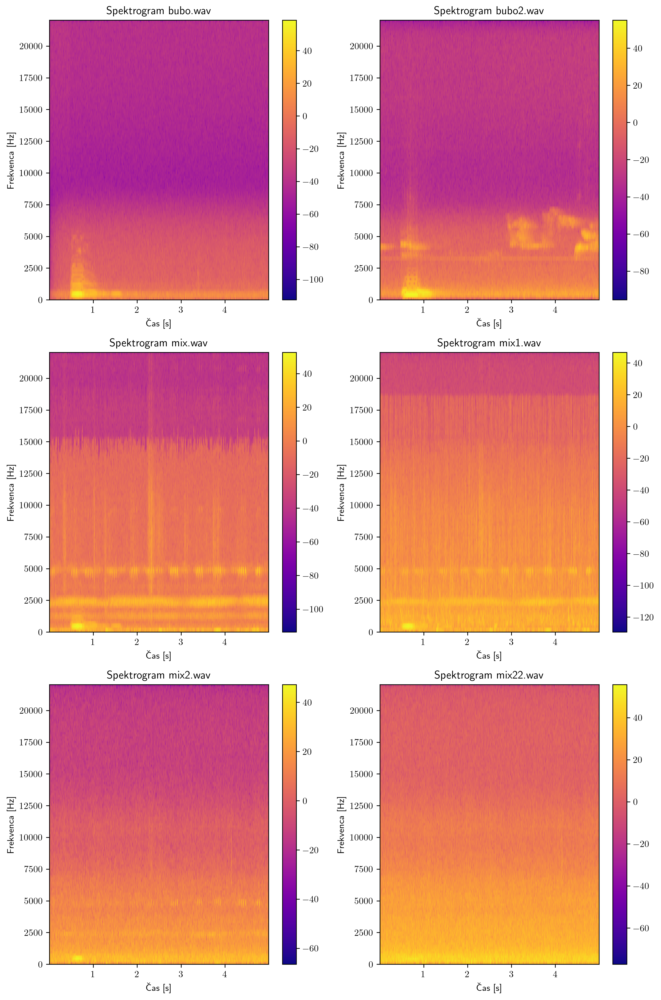

In [4]:
#Spectrogram
fig, axes = plt.subplots(3, 2, figsize=(10, 15))
axes = axes.flatten()

norm = 1

for i, ax in enumerate(axes):
    d = data[i] / norm
    sample_rate = sampling[i]
    pxx, freqs, bins, im = ax.specgram(d, Fs=sample_rate, cmap='plasma')
    ax.set_title(f'Spektrogram {names[i]}.wav')
    ax.set_xlabel('Čas [s]')
    ax.set_ylabel('Frekvenca [Hz]')
    fig.colorbar(im, ax=ax)

plt.tight_layout()


In [5]:
# Function definitions

def FFT(x, fs, N=0, shift=False):
    if N == 0:
        N = len(x)
    X = np.fft.fft(x, N)
    f = np.fft.fftfreq(N, 1/fs)
    if shift:
        X = np.fft.fftshift(X)
        f = np.fft.fftshift(f)
    return X, f

def IFFT(X, fs, N=0):
    if N == 0:
        N = len(X)
    x = np.fft.ifft(X, N)
    t = np.fft.fftfreq(N, 1/fs)
    return x, t

def auto_corr_def(h_data):
    times = []
    t0 = timeit.default_timer()
    N = h_data.shape[0]
    ns = np.arange(N)
    autocorr_points = []
    for n in ns:
        #print(f'{n}/{N}', end='\r')
        A = 1 / (N - n)
        sum = 0
        for i in range(N - n):
            sum += h_data[i] * h_data[i + n]
        autocorr_points.append(A * sum)
        t1 = timeit.default_timer()
        times.append(t1 - t0)
        t0 = t1
    return autocorr_points, ns, times

def pad_data(data):
    N = len(data)
    pad = np.zeros(N)
    return np.hstack((data, pad))

def auto_corr_np_def(h_data):
    times = []
    t0 = timeit.default_timer()
    N = h_data.shape[0]
    ns = np.arange(N)
    autocorr_points = []
    h_pad = pad_data(h_data)
    for n in ns:
        #print(f'{n}/{N}', end='\r')
        A = 1 / (N - n)
        h_pad = pad_data(h_data)
        h_pad_roll = np.roll(h_pad, n)
        out = A * np.dot(h_pad, h_pad_roll)
        autocorr_points.append(out)
        t1 = timeit.default_timer()
        times.append(t1 - t0)
        t0 = t1

    return autocorr_points, ns, times

def auto_corr_fft(h_data, minus_n = True):
    times = []
    t0 = timeit.default_timer()
    N = h_data.shape[0]
    ns = np.arange(N)
    autocorr_points = []
    h_pad = pad_data(h_data)
    h_fft, h_freqs = FFT(h_pad, 1)
    h_fft, h_freqs = IFFT(np.abs(h_fft)**2, 1)
    for n in ns:
        #print(f'{n}/{N}', end='\r')
        A = 1 / (N)
        if minus_n:
            A = 1 / (N - n)
        out = A * h_fft[n]
        autocorr_points.append(out)
        t1 = timeit.default_timer()
        times.append(t1 - t0)
        t0 = t1

    return autocorr_points, ns, times

def auto_corr_fft_time(h_data):
    ac_fft, ns_fft, t = auto_corr_fft(h_data, minus_n=False)
    h_mean = np.mean(h_data)
    return (ac_fft - h_mean**2) / (ac_fft[0] - h_mean**2), ns_fft


## Avtokorelacijska funkcija

Ker imamo opravka z močno zašumljenimi signali, si bomo pri njihovi analizi pomagali z avtokorelacijsko funkcijo. Ker so naši posnetki vzorčeni z relativno visiko vzorčno frekvenco (44.1 kHz), moramo razmisliti o učinkoviti implementaciji. Avtokorelacijsko funkcijo implementiramo na 3 načine in jo testiramo na testnem zašumljenem signalu. Uporabimo 3 različne metode izračuna:

1. Po definiciji za diskretne vrednosti v jeziku Python:
\begin{equation*}
  \phi_{hh}(n) = \frac{1}{N - n}\sum_{k=0}^{N-1} h_{k+n}\, h_k \>,
\end{equation*}
2. Po definiciji z modifikacijo za `numpy`, kjer ima signal $h$ dolžine $N$ dodan "zero-padding" dolžine $N$, kar poimenujemo $\tilde{h}$ in zapišemo:
\begin{equation*}
  \phi_{hh}(n) = \frac{1}{N - n}\sum_{k=0}^{2N-1} \tilde{h}_{k+n}\, \tilde{h}_k \>.
\end{equation*}
3. Z uporabo FFT. Naj bo  $H = \mathcal{F}(h)$, tedaj je korelacijska funkcija podana kot:
\begin{equation*}
  \phi_{hh}(n) = \frac{1}{N-n}\mathcal{F}^{-1} \left[ \, \mid H \mid^2 \, \right]
\end{equation*}

Test izvedemo na funkciji $f$, ki je sestavljena iz vsot in produktov elementarnih funkcij z dodanim šumom.


In [6]:
smpl_rate = 2240
n = np.linspace(0, 16*np.pi, smpl_rate)
sin = np.sin(n) * np.sqrt(n) + np.cos(3*n) * np.tan(n)  + np.random.pareto(5, smpl_rate) * np.random.rand(smpl_rate) * 3 * (-1)**np.random.randint(0, 2, smpl_rate)

po_def, f, t1 = auto_corr_def(sin)
po_def_np, f, t2 = auto_corr_np_def(sin)
po_fft, f, t3 = auto_corr_fft(sin)

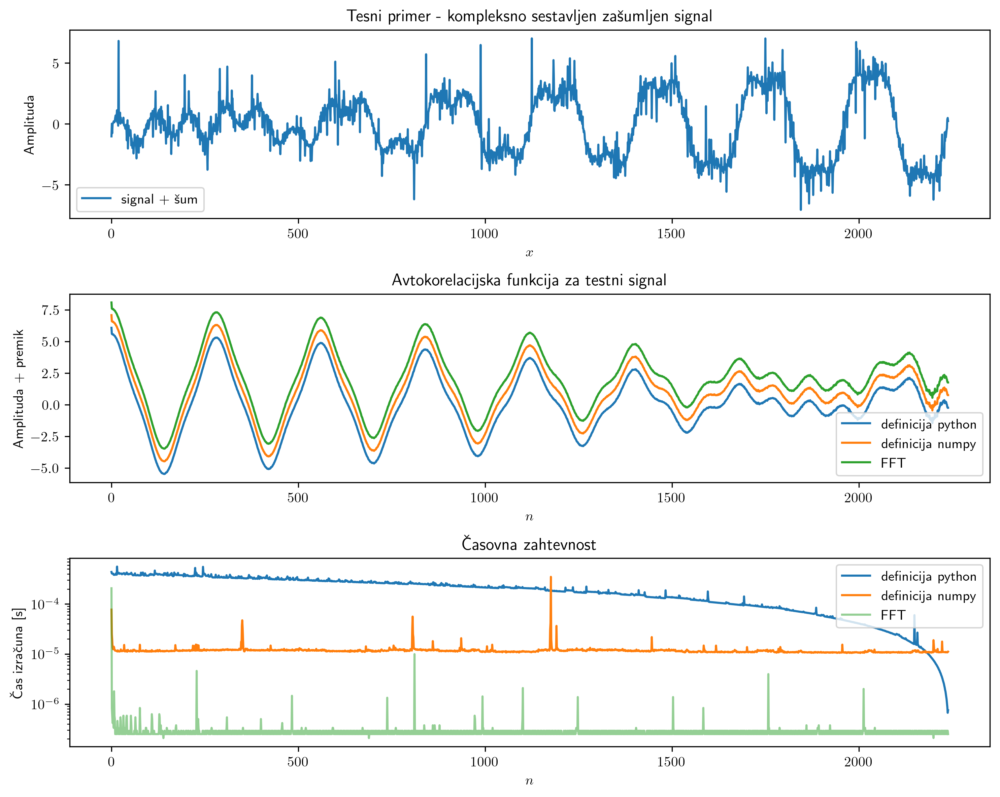

In [7]:
fig, axes = plt.subplots(3, 1, figsize=(10, 8))
ax1, ax2, ax3 = axes.flatten()

ax1.plot(sin, label='signal + šum')
ax1.legend()
ax1.set_xlabel('$x$')
ax1.set_ylabel('Amplituda')
ax1.set_title('Tesni primer - kompleksno sestavljen zašumljen signal')

ax2.plot(f, np.array(po_def), label='definicija python', alpha=1)
ax2.plot(f, np.real(np.array(po_def_np)) + 1, label='definicija numpy', alpha=1)
ax2.plot(f, np.real(np.array(po_fft)) + 2, label='FFT', alpha=1)
ax2.legend()
ax2.set_xlabel('$n$')
ax2.set_ylabel('Amplituda + premik')
ax2.set_title('Avtokorelacijska funkcija za testni signal')


ax3.plot(f, t1, label='definicija python', alpha=1)
ax3.plot(f, t2, label='definicija numpy', alpha=1)
ax3.plot(f, t3, label='FFT', alpha=0.5)
ax3.legend()
ax3.set_yscale('log')
ax3.set_xlabel('$ n $')
ax3.set_ylabel('Čas izračuna [s]')
ax3.set_title('Časovna zahtevnost')


plt.tight_layout()
plt.show()

Iz rezultatov slutimo, da avtokorelacijska funkcija $f$ na nek način "izpovpreči" in tako odstrani šum. Vendar zgodba ni tako preprosta, saj obliki funkcij nista zares primerljivi. Iz primerjave časovne zahtevnosti ugotovimo, da je implementacija z uporabo FFT nekaj velikostnih redov hitrejša od ostalih dveh algoritmov. Odločimo se za uporabo FFT.

## Analiza frekvenčnega spektra

Sove bomo verjetno najlažje razločili na podlagi frekvence skovika. Zato neobdelan posnetek z uporabo FFT pretvorimo v frekvenčni spekter. Ugotovimo, da so signali precej zašumljeni, šum pa je prisoten predvsem pri nižjih frekvencah. Kot smo ugotovili iz spektrogramov, nas zanima predvsem območje do 1 kHz. Iz prvih dveh jasnih posnetkov (`bubo` in `bubo2`) opazimo porast amplitude pri ~ 335 Hz in ~375 Hz. Vendar so nekateri signali še vedno preveč zašumljeni, da bi lahko sove zanesljivo ločili.

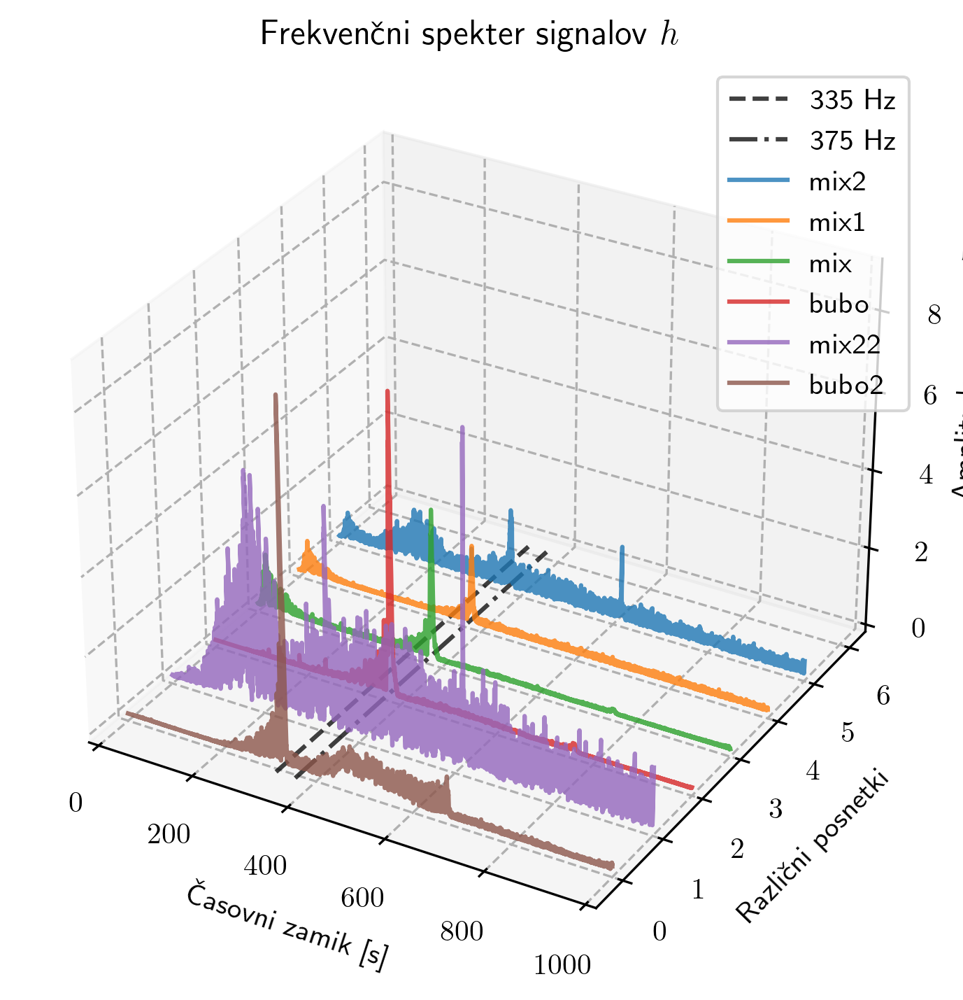

In [8]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.plot([335]*10, np.linspace(-0.2, 6, 10), zs=0, zdir='z', color='black', alpha=0.75, label='335 Hz', linestyle='dashed')
ax.plot([375]*10, np.linspace(-0.2, 6, 10), zs=0, zdir='z', color='black', alpha=0.75, label='375 Hz', linestyle='dashdot')

yticks = np.arange(6)
ord = [1, 5, 0, 2, 3, 4]
data_s = [data[i] for i in ord]
sampling_s = [sampling[i] for i in ord]
names_s = [names[i] for i in ord]
for i, d in enumerate(data_s):
    i = len(data_s) - i - 1
    sample_rate = sampling_s[i]
    ac_fft, ac_freq = FFT(data_s[i], sample_rate)
    ac_fft = np.abs(ac_fft)
    mask = (ac_freq > 0) & (ac_freq < 1000)
    ax.plot(ac_freq[mask], ac_fft[mask], zs=i, zdir='y', alpha=0.8, label=names_s[i])

ax.set_xlabel('Časovni zamik [s]')
ax.set_ylabel('Različni posnetki')
ax.set_zlabel('Amplituda')
ax.legend()
ax.zaxis.labelpad=-1.2 # <- change the value here

plt.xlim(0, 1000)
plt.title('Frekvenčni spekter signalov $h$')
plt.tight_layout()
plt.show()

V nadaljevanju za zvočne posnetke izračunamo relativno avtokorelacijsko funkcijo 

\begin{equation*}
\widetilde{\phi}_{hh}(n) = 
{ \phi_{hh}(n) - \langle h\rangle^2 \over \phi_{hh}(0) - \langle h\rangle^2 } \>,  
\end{equation*}

kjer je  
\begin{equation*}
\langle h\rangle = \frac{1}{N} \sum_{k=0}^{N-1} h_k \>.  
\end{equation*}

Na spodnjem grafu prikažemo $| \widetilde{\phi}_{hh} |$.

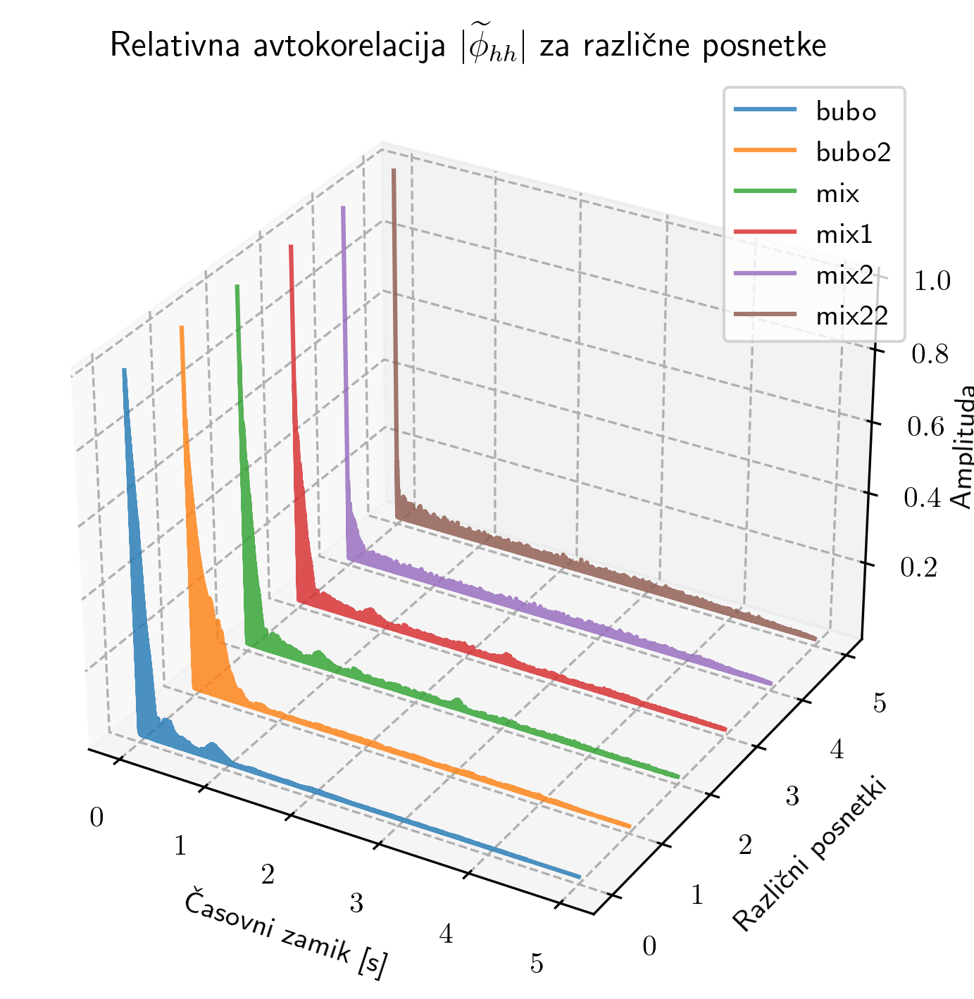

In [9]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

yticks = np.arange(6)
for i, in zip(yticks):
    sample_rate = sampling[i]
    ac_fft, ns_fft= auto_corr_fft_time(data[i])
    ac_fft = np.abs(ac_fft)
    ax.plot(ns_fft / sample_rate, ac_fft, zs=i, zdir='y', alpha=0.8, label=names[i])

ax.set_xlabel('Časovni zamik [s]')
ax.set_zlabel('Amplituda')
ax.set_ylabel('Različni posnetki')
ax.legend()
ax.zaxis.labelpad=-0.9 # <- change the value here


plt.title('Relativna avtokorelacija $| \widetilde{\phi}_{hh} |$ za različne posnetke')
plt.tight_layout()
plt.show()

Ker si tudi iz tega grafa ne znamo pomagati, ponovno uporabimo FFT in avtokorelacijsko funkcijo pretvorimo v frekvenčni spekter.

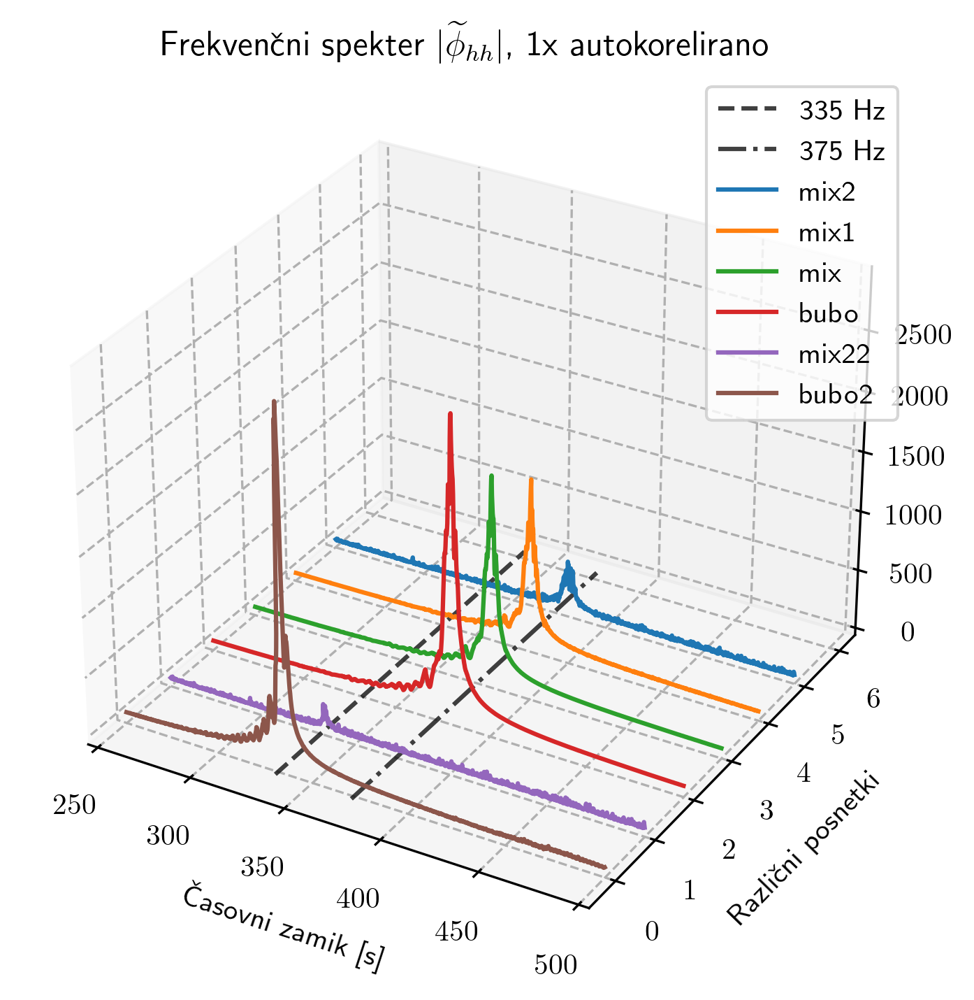

In [10]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.plot([335]*10, np.linspace(-0.2, 6, 10), zs=0, zdir='z', color='black', alpha=0.75, label='335 Hz', linestyle='dashed')
ax.plot([375]*10, np.linspace(-0.2, 6, 10), zs=0, zdir='z', color='black', alpha=0.75, label='375 Hz', linestyle='dashdot')

yticks = np.arange(6)
ord = [1, 5, 0, 2, 3, 4]
data_s = [data[i] for i in ord]
sampling_s = [sampling[i] for i in ord]
names_s = [names[i] for i in ord]
for i, d in enumerate(data_s):
    i = len(data_s) - i - 1
    sample_rate = sampling_s[i]
    ac_fft, ns_fft = auto_corr_fft_time(data_s[i])
    ac_fft, ac_freq = FFT(ac_fft, sample_rate)
    ac_fft = np.abs(ac_fft)
    #plt.plot( alpha=0.8, label=names[i])
    mask = (ac_freq > 250) & (ac_freq < 500)

    ax.plot(ac_freq[mask], ac_fft[mask], zs=i, zdir='y', alpha=1, label=names_s[i])
    ax.set_xlim(250, 500)

ax.set_xlabel('Časovni zamik [s]')
ax.set_ylabel('Različni posnetki')
ax.legend()
ax.zaxis.labelpad=-0.9 # <- change the value here

plt.xlim(250, 500)
plt.title('Frekvenčni spekter $| \widetilde{\phi}_{hh} |$, 1x autokorelirano')
plt.tight_layout()
plt.show()

Z uporabo avtokorelacije smo se precej uspešno znebili šuma. Še vedno pa nekatere "špice" (`mix22`) niso pretirano izrazite. Avtokorelacijo uporabimo še enkrat.

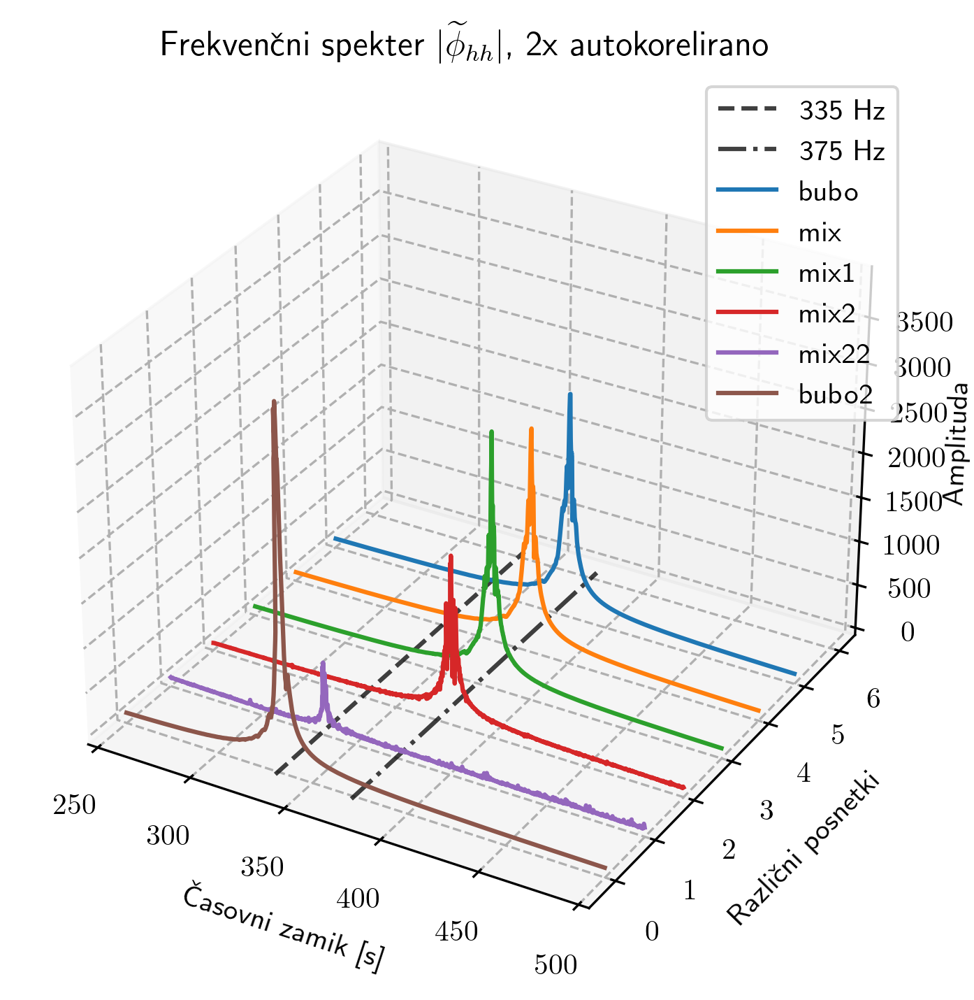

In [11]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.plot([335]*10, np.linspace(-0.2, 6, 10), zs=0, zdir='z', color='black', alpha=0.75, label='335 Hz', linestyle='dashed')
ax.plot([375]*10, np.linspace(-0.2, 6, 10), zs=0, zdir='z', color='black', alpha=0.75, label='375 Hz', linestyle='dashdot')

yticks = np.arange(6)
ord = [1, 5, 4, 3, 2, 0]
data_s = [data[i] for i in ord]
sampling_s = [sampling[i] for i in ord]
names_s = [names[i] for i in ord]
for i, d in enumerate(data_s):
    i = len(data_s) - i - 1
    sample_rate = sampling_s[i]
    ac_fft, ns_fft = auto_corr_fft_time(data_s[i])
    ac_fft, ns_fft = auto_corr_fft_time(ac_fft)
    ac_fft, ac_freq = FFT(ac_fft, sample_rate)
    ac_fft = np.abs(ac_fft)
    #plt.plot( alpha=0.8, label=names[i])
    mask = (ac_freq > 250) & (ac_freq < 500)
    ax.plot(ac_freq[mask], ac_fft[mask], zs=i, zdir='y', alpha=1, label=names_s[i])
    ax.set_xlim(250, 500)

ax.set_xlabel('Časovni zamik [s]')
ax.set_ylabel('Različni posnetki')
ax.set_zlabel('Amplituda')
ax.legend()
ax.zaxis.labelpad=-0.9 # <- change the value here

plt.xlim(250, 500)
plt.title('Frekvenčni spekter $| \widetilde{\phi}_{hh} |$, 2x autokorelirano')
plt.tight_layout()
plt.show()

Na zadnjem grafu lahko končno zanesljivo razberemo frekvence skovikov, in sicer $(335 \pm 10) \; \text{Hz}$ za sovo Simona in $(375 \pm 10) \; \text{Hz}$ za Garfunkla. Na podlagi tega izpolnimo spodnjo tabelo in v vsakem posnetku določimo nastopajočo sovo.

In [12]:
datoteka = ['bubo', 'bubo2', 'mix', 'mix1', 'mix2', 'mix22']

tabela = [
    ['bubo.wav', 'Velika uharica Simon', 'Simon (bubo)'],
    ['bubo2.wav', 'Velika uharica Garfunkel', 'Garfunkel (bubo2)'],
    ['mix.wav', 'Neznana uharica + čricki', 'Simon (bubo)'],
    ['mix1.wav', 'Neznana uharica + čricki + potok',  'Simon (bubo)'],
    ['mix2.wav', 'Neznana uharica + čricki + deroča reka', 'Simon (bubo)'],
    ['mix22.wav', 'Neznana uharica + deroča reka', 'Garfunkel (bubo2)'],
]

df = pd.DataFrame(tabela ,columns=['Datoteka', 'Opis', 'Določena sova'])

html1 = df.to_html(index=False)
display(HTML(centerHTML(html1, text='Tabela 2: Rezultati analize zvoka.')))

Datoteka,Opis,Določena sova
bubo.wav,Velika uharica Simon,Simon (bubo)
bubo2.wav,Velika uharica Garfunkel,Garfunkel (bubo2)
mix.wav,Neznana uharica + čricki,Simon (bubo)
mix1.wav,Neznana uharica + čricki + potok,Simon (bubo)
mix2.wav,Neznana uharica + čricki + deroča reka,Simon (bubo)
mix22.wav,Neznana uharica + deroča reka,Garfunkel (bubo2)


## Dodatek: S kakšno frekvenco prede Henry?

> In the whimsical realm of quantum catodynamics, physicists have long pondered the enigmatic phenomenon of cat purring. According to the interstellar "Hitchhiker's Guide to the Galaxy," cats have been granted the rare ability to oscillate at a quantum frequency that transcends the boundaries of Schrödinger's box. It's not just a soothing sound; it's a cosmic symphony that defies the laws of physics as we know them. Some quantum quirk in the feline waveform allows cats to simultaneously purr and not purr, rendering them in a state of purrplexity, or what scientists affectionately refer to as "Schrödinger's Cat Purradox." It's a profound reminder that the universe is full of surprises, especially when it comes to our feline friends and their quantum serenades.

V dodatku poskusimo odgovoriti na dolgo pereče vprašanje... s kakšno frekvenco prede Henry?

In [21]:
display(HTML(insertHTMLAudio('./data/preja.wav', 'cat.wav')))

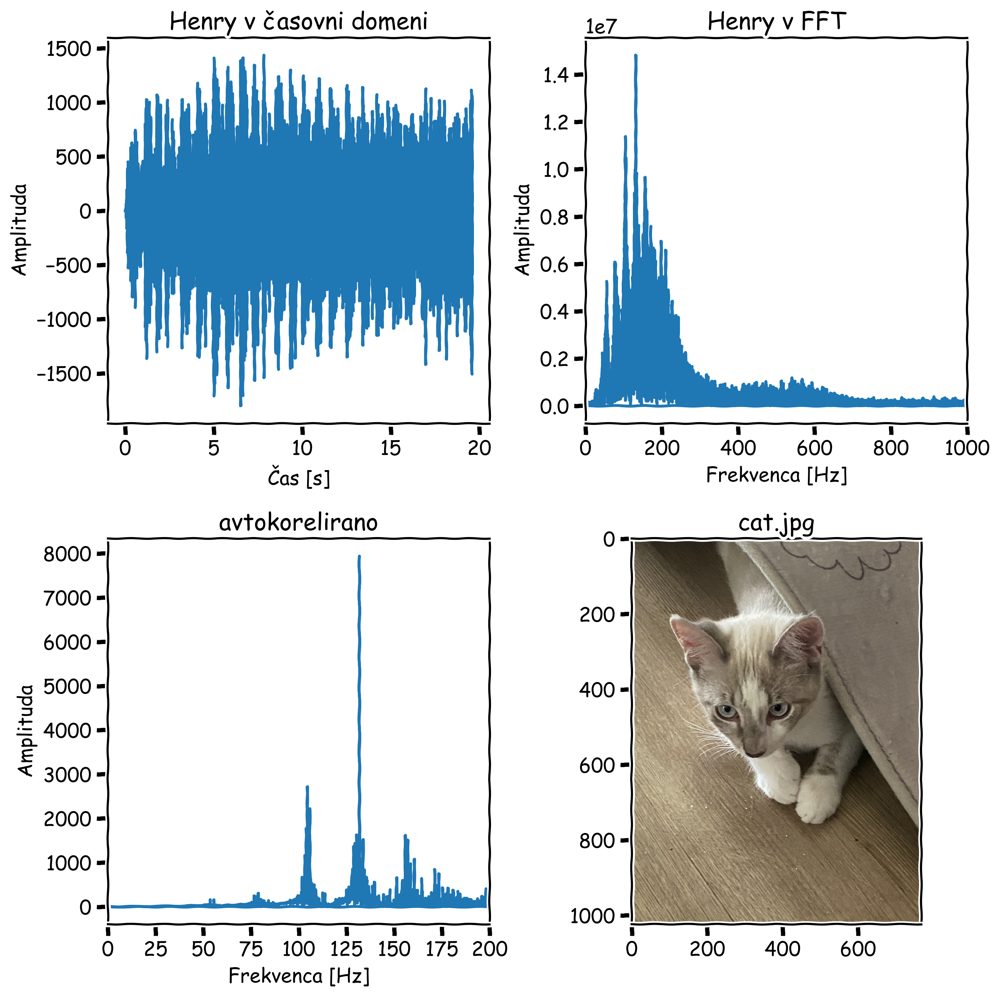

In [23]:
p7, cat = wavfile.read('./data/preja.wav')
plt.rcParams['text.usetex'] = False
import matplotlib.image as mpimg
img = mpimg.imread('./data/henry.jpeg')

with plt.xkcd():
    fig, axes = plt.subplots(2, 2, figsize=(10, 10))
    ax1, ax2, ax3, ax4 = axes.flatten()

    str_fft, str_freq = FFT(cat, p7)
    ax1.plot(np.linspace(0, len(cat) / p7, len(cat)), cat)
    ax1.set_xlabel('Čas [s]')
    ax1.set_ylabel('Amplituda')
    ax1.set_title('Henry v časovni domeni')

    ax2.plot(str_freq, np.abs(str_fft))
    ax2.set_xlim(0, 1000)
    ax2.set_xlabel('Frekvenca [Hz]')
    ax2.set_ylabel('Amplituda')
    ax2.set_title('Henry v FFT')

    cat_fft, ns_fft = auto_corr_fft_time(cat)
    cat_fft, ns_fft = auto_corr_fft_time(cat_fft)
    cat_fft, ac_freq = FFT(cat_fft, p7)
    cat_fft = np.abs(cat_fft)
    #plt.plot( alpha=0.8, label=names[i])
    ax3.plot(ac_freq, cat_fft)
    ax3.set_xlim(0, 200)
    ax3.set_xlabel('Frekvenca [Hz]')
    ax3.set_ylabel('Amplituda')
    ax3.set_title('avtokorelirano')

    ax4.imshow(img)
    ax4.set_title('cat.jpg')
    
    plt.tight_layout()


Določena frekvenca $\nu_{\text{p}} = 130 \; \text{Hz} \; \pm \; 10 \; \text{Hz}$ Henryja uvršča med višje-frekvenčne predilce, saj se tipični spekter razpenja med 20 in 150 Hz.

## Zaključek

Z uporabo FFT in izračunom funkcije avtokorelacije smo v frekvenčni sliki uspešno ločili med dvema signaloma različnih frekvenc tudi v najbolj zašumljenih primerih. Primerjali smo različne metode za izračun avtokorelacije in ugotovili, da je izračun s pomočjo FFT najbolj učinkovit.

---
Luka Skeledžija, [Github source 🔗](https://github.com/lukaske/mafijski-praktikum/tree/main/MFPR/05_FFT), 2023